### **QUESTÕES**

##### **QUESTÃO 1:** Existe alguma relação explícita entre as despesas de campanha de um candidato e o número de votos que ele recebeu na eleição?

#### **QUESTÃO 2**: Em sistemas de eleição proporcionais, uma das discussões mais importantes é a respeito do fato de que o número de votos que um partido recebe não se reflete, necessariamente, no número de cadeiras que conquista. De que forma isso afeta o caso fluminense?

##### **QUESTÃO 3:** Houve alguma mudança significativa no número de cadeiras na Câmara dos deputados obtidas por diferentes partidos ao longo do tempo? Em particular, é possível perceber alguma movimentação do eleitorado entre os espectros políticos no contexto de embate entre bolsonarismo e petismo?

##### **QUESTÃO 4:** Existe alguma tendência de filiação partidária a algum determinado partido de acordo com a renda do candidato? Ou seja, candidatos com os maiores valores declarados em bens são mais propensos a disputar as eleições por um determinado partido?

##### **QUESTÃO 5:** Quais cargos políticos são mais facilmente acessados por minorias representativas? Ou seja, quais cargos políticos são mais propensos a serem ocupados por por candidatas mulheres, pessoas não-brancas e pessoas com menores graus de instrução, por exemplo?

In [22]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely import wkt
import numpy as np
import warnings

warnings.filterwarnings('ignore')

In [23]:
data_original = pd.read_csv('datasets/cleanData.csv')
data = data_original.copy()
data['ano'] = data['ano'].astype(str)

data.head()

,ano,id_candidato_bd,nome_urna,sigla_partido,cargo,genero,raca,resultado,votos,bens_declarados,despesas_campanha,tipo_eleicao,new_partido
0,2022,1244391,Daniela Do Waguinho,UNIÃO,deputado federal,feminino,branca,eleito por qp,213706,733291.33,3080522.00,federal,UNIÃO
1,2022,596743,General Pazuello,PL,deputado federal,masculino,branca,eleito por qp,205324,1288362.00,944065.37,federal,PR/PL
2,2022,1367243,Taliria Petrone,PSOL,deputado federal,feminino,preta,eleito por qp,198548,19498.36,1575937.20,federal,PSOL
3,2022,723988,Doutor Luizinho,PP,deputado federal,masculino,branca,eleito por qp,190071,3579347.95,1248760.96,federal,PP
4,2022,1278961,Márcio Canella,UNIÃO,deputado estadual,masculino,branca,eleito por qp,181274,3766549.57,1260269.21,federal,UNIÃO


In [24]:
dicionario = {
    'eleito por qp': 'Eleito',
    'eleito por media': 'Eleito',
    'eleito': 'Eleito',
    'nao eleito': 'Não eleito',
    'masculino': 'Masculino',
    'feminino': 'Feminino'
}

data = data.replace(dicionario)

In [25]:
n_candidatos = data.groupby(['ano', 'tipo_eleicao']).size().reset_index(name='n_candidatos')

n_candidatos['ano'] = n_candidatos['ano'].astype(str)

fig = px.bar(n_candidatos,
            x = 'ano', 
             y = 'n_candidatos',
             color = 'tipo_eleicao',
             color_discrete_sequence=['firebrick', '#373e9e'],
             labels = {'n_candidatos': 'Número de candidatos', 'tipo_eleicao': 'Tipo de eleição', 'ano': 'Ano'},
             category_orders = {'ano': ['2008', '2010', '2012', '2014', '2016', '2018', '2020', '2022']})

fig.update_yaxes(linecolor = 'black', gridcolor = 'white', mirror = True, showticklabels = True)
fig.update_xaxes(linecolor = 'black', gridcolor = 'white', mirror = True, showticklabels = True)
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.update_layout(width = 700, height = 500, plot_bgcolor = 'white', paper_bgcolor = 'white',
                  title = {'text': 'Número de candidatos por ano e tipo de eleição', 'x': 0.5, 'y': 0.95, 'xanchor': 'center', 'yanchor': 'top'})
fig.show()

# save figure
fig.write_image('viz/fig1_N_Candidatos.png')

## **QUESTÃO 1:** Existe alguma relação explícita entre as despesas de campanha de um candidato e o número de votos que ele recebeu na eleição?

In [26]:
data_federal = data.query('resultado.isin(["Eleito", "Não eleito"]) and tipo_eleicao == "federal"')

despesa_ajustada = []
votos_ajustados = []

for i in range(len(data_federal)):
    
    if data_federal.iloc[i]['resultado'] == 'Não eleito':

        if data_federal.iloc[i]['votos'] > 0 and data_federal.iloc[i]['votos'] < 50000 and data_federal.iloc[i]['despesas_campanha'] > 0 and data_federal.iloc[i]['despesas_campanha'] < 100000:
            novo_voto = data_federal.iloc[i]['votos'] + np.random.randint(0, 20000)
            nova_despesa = data_federal.iloc[i]['despesas_campanha'] + np.random.randint(0, 150000)
    
        votos_ajustados.append(novo_voto)
        despesa_ajustada.append(nova_despesa)
    
    else:
        novo_voto = data_federal.iloc[i]['votos'] + np.random.randint(0, 1000)
        nova_despesa = data_federal.iloc[i]['despesas_campanha'] + np.random.randint(0, 10000)
        votos_ajustados.append(novo_voto)
        despesa_ajustada.append(nova_despesa)

data_federal['votos_ajustados'] = votos_ajustados
data_federal['despesa_ajustada'] = despesa_ajustada

In [27]:
# Figura 1: Despesas de campanha e votos em eleições federais

fig = px.scatter(data_federal,
                x = 'despesa_ajustada', 
               y = 'votos_ajustados',
               facet_col='ano',
               facet_col_spacing=0.05,
               opacity=0.8,
               color = 'resultado',
               color_discrete_sequence=['#6495ED', '#FF7F50'],
               labels = {'votos_ajustados': 'Número de votos', 'resultado': '', 'despesa_ajustada': 'Despesas de campanha'},
               category_orders = {'ano': ['2010', '2014', '2018', '2022']},
               hover_data = ['nome_urna', 'sigla_partido', 'despesas_campanha', 'votos', 'cargo'])

fig.update_yaxes(range = (0, 1.5e5), linecolor = 'black', gridcolor = 'white', mirror = True, showticklabels = True)
fig.update_xaxes(range = (0, 0.8e6), linecolor = 'black', gridcolor = 'white', mirror = True, showticklabels = True)
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.update_layout(width = 1500, height = 500, plot_bgcolor = 'white', paper_bgcolor = 'white',
                  title = {'text': 'Despesas de campanha e votos em eleições federais', 'x': 0.5, 'y': 0.95, 'xanchor': 'center', 'yanchor': 'top'})
fig.update_traces(texttemplate='%{text:}%', textfont = {'color': 'black', 'size': 13})
fig.show()

fig.write_image('viz/fig2_Despesas de campanha e votos_federal.png')

In [28]:
# Figura 2: Despesas de campanha e votos em eleições federais por gênero

fig = px.scatter(data_federal,
             x = 'despesa_ajustada', 
             y = 'votos_ajustados',
             facet_col='ano',
             facet_row='genero',
             facet_col_spacing=0.05,
             facet_row_spacing=0.1,
             opacity=0.8,
             color = 'resultado',
            color_discrete_sequence=['#6495ED', '#FF7F50'], 
             labels = {'votos_ajustados': 'Número de votos', 'resultado': '', 'despesa_ajustada': 'Despesas de campanha'},
             category_orders={'ano': ['2010', '2014', '2018', '2022'], 'genero': ['Masculino', 'Feminino']},
             hover_data = ['nome_urna', 'sigla_partido', 'despesas_campanha', 'votos'])

fig.update_yaxes(range = (0, 1.5e5), linecolor = 'black', gridcolor = 'white', mirror = True, showticklabels = True)
fig.update_xaxes(range = (0, 0.8e6), linecolor = 'black', gridcolor = 'white', mirror = True, showticklabels = True)
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.update_layout(width = 1500, height = 800, plot_bgcolor = 'white', paper_bgcolor = 'white',
                  title = {'text': 'Despesas de campanha e votos por gênero em eleições federais', 'x': 0.5, 'y': 0.98, 'xanchor': 'center', 'yanchor': 'top'})
fig.update_traces(texttemplate='%{text:}%', textfont = {'color': 'black', 'size': 13})
fig.show()

fig.write_image('viz/fig3_Despesas de campanha e votos por genero_federal.png')

In [29]:
data_municipal = data.query('resultado.isin(["Eleito", "Não eleito"]) and tipo_eleicao == "municipal"')

votos_ajustados = []
despesa_ajustada = []

for i in range(len(data_municipal)):
    
    if data_municipal.iloc[i]['resultado'] == 'Não eleito':

        if data_municipal.iloc[i]['votos'] > 0 and data_municipal.iloc[i]['votos'] < 5000 and data_municipal.iloc[i]['despesas_campanha'] > 0 and data_municipal.iloc[i]['despesas_campanha'] < 50000:
            novo_voto = data_municipal.iloc[i]['votos'] + np.random.randint(0, 2000)
            nova_despesa = data_municipal.iloc[i]['despesas_campanha'] + np.random.randint(0, 20000)
    
        votos_ajustados.append(novo_voto)
        despesa_ajustada.append(nova_despesa)
    
    else:
        novo_voto = data_municipal.iloc[i]['votos'] + np.random.randint(0, 1000)
        nova_despesa = data_municipal.iloc[i]['despesas_campanha'] + np.random.randint(0, 10000)
        votos_ajustados.append(novo_voto)
        despesa_ajustada.append(nova_despesa)

data_municipal['votos_ajustados'] = votos_ajustados
data_municipal['despesa_ajustada'] = despesa_ajustada

In [30]:
# Figura 3: Despesas de campanha e votos em eleições municipais

fig = px.scatter(data_municipal,
             x = 'despesa_ajustada', 
             y = 'votos_ajustados',
             facet_col='ano',
             facet_col_spacing=0.05,
             opacity=0.7,
             color = 'resultado',
            color_discrete_sequence=['#6495ED', '#FF7F50'],
             labels = {'votos_ajustados': 'Número de votos', 'resultado': '', 'despesa_ajustada': 'Despesas de campanha'},
             category_orders={'ano': ['2008', '2012', '2016', '2020']},
             hover_data = ['nome_urna', 'sigla_partido', 'despesas_campanha', 'votos'])

fig.update_yaxes(range = (0, 1.5e4), linecolor = 'black', gridcolor = 'white', mirror = True, showticklabels = True)
fig.update_xaxes(range = (0, 1.5e5), linecolor = 'black', gridcolor = 'white', mirror = True, showticklabels = True)
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.update_layout(width = 1500, height = 500, plot_bgcolor = 'white', paper_bgcolor = 'white',
                  title = {'text': 'Despesas de campanha e votos em eleições municipais', 'x': 0.5, 'y': 0.98, 'xanchor': 'center', 'yanchor': 'top'})
fig.update_traces(texttemplate='%{text:}%', textfont = {'color': 'black', 'size': 13})
fig.show()

fig.write_image('viz/fig4_Despesas de campanha e votos_municipal.png')

In [31]:
# Figura 4: Despesas de campanha e votos em eleições municipais por gênero

fig = px.scatter(data_municipal,
             x = 'despesa_ajustada', 
             y = 'votos_ajustados',
             facet_col='ano',
             facet_row='genero',
             facet_col_spacing=0.05,
             facet_row_spacing=0.1,
             opacity=0.7,
             color = 'resultado',
            color_discrete_sequence=['#6495ED', '#FF7F50'],
             labels = {'votos_ajustados': 'Número de votos', 'resultado': '', 'despesa_ajustada': 'Despesas de campanha'},
             category_orders={'ano': ['2008', '2012', '2016', '2020']},
             hover_data = ['nome_urna', 'sigla_partido', 'despesas_campanha', 'votos'])

fig.update_yaxes(range = (0, 1.5e4), linecolor = 'black', gridcolor = 'white', mirror = True, showticklabels = True)
fig.update_xaxes(range = (0, 1.5e5), linecolor = 'black', gridcolor = 'white', mirror = True, showticklabels = True)
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.update_layout(width = 1500, height = 800, plot_bgcolor = 'white', paper_bgcolor = 'white',
                  title = {'text': 'Despesas de campanha e votos por gênero em eleições municipais', 'x': 0.5, 'y': 0.98, 'xanchor': 'center', 'yanchor': 'top'})
fig.update_traces(texttemplate='%{text:}%', textfont = {'color': 'black', 'size': 13})
fig.show()

fig.write_image('viz/fig5_Despesas de campanha e votos por genero_municipal.png')

## **QUESTÃO 2**: Em sistemas de eleição proporcionais, uma das discussões mais importantes é a respeito do fato de que o número de votos que um partido recebe não se reflete, necessariamente, no número de cadeiras que conquista. De que forma isso afeta o caso fluminense?

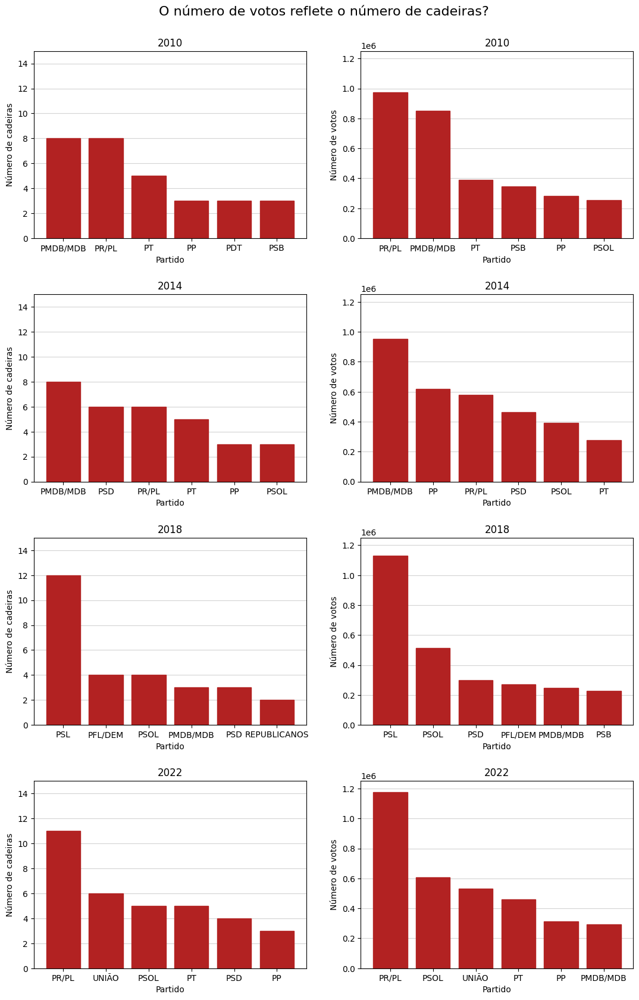

In [32]:
cadeiras_por_partido = data.groupby(['new_partido', 'ano', 'tipo_eleicao', 'resultado', 'cargo'])['resultado'].count().reset_index(name = 'count')
eleitos = cadeiras_por_partido.query('resultado == "Eleito" and tipo_eleicao == "federal" and cargo == "deputado federal"')

top5_cadeiras_por_ano = {}

for ano in eleitos['ano'].unique():
    top5 = eleitos.query('ano == @ano').sort_values(by = 'count', ascending = False).head(6)
    top5_cadeiras_por_ano[ano] = top5

votos_por_partido = data.groupby(['new_partido', 'ano', 'tipo_eleicao', 'resultado', 'cargo'])['votos'].sum().reset_index(name = 'count')
eleitos = votos_por_partido.query('resultado == "Eleito" and tipo_eleicao == "federal" and cargo == "deputado federal"')

top5_votos_por_ano = {}
for ano in eleitos['ano'].unique():
    top5 = eleitos.query('ano == @ano').sort_values(by = 'count', ascending = False).head(6)
    top5_votos_por_ano[ano] = top5


# plot a bar chart for each year where each bar represents a party
# make subplots where the graphs on the left are the number of seats and the graphs on the right are the number of votes
# x axis must be independent for each graph

fig, axs = plt.subplots(4, 2, figsize = (13, 20))

for i, ano in enumerate(sorted(top5_cadeiras_por_ano.keys())):
    axs[i,0].bar(top5_cadeiras_por_ano[ano]['new_partido'], top5_cadeiras_por_ano[ano]['count'])
    axs[i,0].set_title(ano)
    axs[i,0].set_ylabel('Número de cadeiras')
    axs[i,0].set_xlabel('Partido')
    axs[i,0].grid(axis = 'y', color = 'lightgrey')
    axs[i,0].set_axisbelow(True)
    axs[i,0].set_ylim(0, 15)
    
    axs[i,1].bar(top5_votos_por_ano[ano]['new_partido'], top5_votos_por_ano[ano]['count'])
    axs[i,1].set_title(ano)
    axs[i,1].set_ylabel('Número de votos')
    axs[i,1].set_xlabel('Partido')
    axs[i,1].grid(axis = 'y', color = 'lightgrey')
    axs[i,1].set_axisbelow(True)
    axs[i,1].set_ylim(0, 1.25e6)

# increase distance between subplots
fig.subplots_adjust(hspace = 0.3)

# add title
#fig.suptitle('Partidos com mais cadeiras e votos no Congresso Nacional', fontsize = 16)

# put a title that does not push the subplots down
fig.text(0.5, 0.91, 'O número de votos reflete o número de cadeiras?', ha = 'center', fontsize = 16)

# change the color of the bars
for i in range(4):
    for j in range(2):
        for bar in axs[i,j].patches:
            bar.set_color('firebrick')

plt.show()

# save the figure
fig.savefig('viz/fig6_N Cadeiras versus N Votos.png', dpi = 300, bbox_inches = 'tight')

## **QUESTÃO 3:** Houve alguma mudança significativa no número de cadeiras na Câmara dos deputados obtidas por diferentes partidos ao longo do tempo? Em particular, é possível perceber alguma movimentação do eleitorado entre os espectros políticos no contexto de embate entre bolsonarismo e petismo?

In [33]:
por_partido = data.groupby(['new_partido', 'ano', 'tipo_eleicao', 'resultado', 'cargo'])['resultado'].count().reset_index(name = 'count')
eleitos = por_partido.query('resultado == "Eleito" and tipo_eleicao == "federal" and cargo == "deputado federal"')

partidos = {
    'PT': 'Esquerda',
    'PSOL': 'Esquerda',
    'PR/PL': 'Direita',
    'UNIÃO': 'Direita',
    'PSL': 'Direita'
}

partidos = pd.DataFrame.from_dict(partidos, orient = 'index', columns=['ideologia']).reset_index()
partidos.rename(columns = {'index': 'new_partido'}, inplace = True)

partidos_ano = eleitos.groupby(['ano', 'new_partido'])['count'].sum().reset_index(name = 'n')
partidos_ano = partidos_ano.merge(partidos, on = 'new_partido')
partidos_ano['new_partido'] = partidos_ano['new_partido'].astype('category')

fig = px.bar(partidos_ano, 
             x = 'n', 
             y = 'new_partido', 
             facet_col = 'ano', 
             text = 'n',
             color = 'ideologia',
             color_discrete_sequence=['#a32b17', '#0f35a0'],
             category_orders = {'ano': ["2010", "2014", "2018", "2022"], 'new_partido': ['PT', 'PSOL', 'PR/PL', 'PSL', 'UNIÃO'], 'ideologia': ['Esquerda', 'Direita']},
             labels = {'new_partido': 'Partido', 'n': 'Número de cadeiras', 'ano': '', 'ideologia': 'Espectro político'})

fig.update_yaxes(range = (-1, 5), linecolor = 'black', gridcolor = 'lightgrey', mirror = True)
fig.update_xaxes(showticklabels = False, range = (0, 20), linecolor = 'black', gridcolor = 'white', mirror = True)
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.update_layout(width = 1300, height = 400, plot_bgcolor = 'white', paper_bgcolor = 'white',
                  title = {'text': 'Distribuição de cadeiras entre partidos de esquerda e direita ao longo do tempo', 'x': 0.5, 'y': 0.95, 'xanchor': 'center', 'yanchor': 'top', 'font': {'size': 16}},)
fig.update_traces(texttemplate='%{text:}', textposition='outside', textfont = {'color': 'black', 'size': 13})
fig.show()

fig.write_image('viz/fig7_Cadeiras Esquerda e Direita ano.png')

## **QUESTÃO 4:** Existe alguma tendência de filiação partidária a algum determinado partido de acordo com a renda do candidato? Ou seja, candidatos com os maiores valores declarados em bens são mais propensos a disputar as eleições por um determinado partido?

In [34]:
max_bem = data.groupby(['ano', 'sigla_partido'])['bens_declarados'].median().reset_index(name = 'max_bem')
max_bem = max_bem.query('ano == "2022"')
#order = list(max_bem.sort_values(by = 'max_bem', ascending = False)['sigla_partido'])

# plot the same graph but now a scatter plot

query = 'ano == "2022" and tipo_eleicao == "federal" and cargo == "deputado federal" and sigla_partido.isin(["PT", "PSOL", "PL", "PSD", "UNIÃO", "PP"])'

fig = px.box(data.query(query).sort_values(by = 'bens_declarados', ascending = False),
                        x = 'bens_declarados',
                        y = 'sigla_partido',
                        color_discrete_sequence=['#3012a7'],
                        #category_orders={'sigla_partido': order},
                        labels = {'sigla_partido': 'Partido', 'bens_declarados': 'Bens declarados (R$)'})

fig.update_layout(width = 1000, height = 500, plot_bgcolor = 'white', paper_bgcolor = 'white',
                  title = {'text': 'Distribuição dos bens declarados por candidatos por partido', 'x': 0.5, 'y': 0.95, 'xanchor': 'center', 'yanchor': 'top', 'font': {'size': 16}},)
fig.update_xaxes(showticklabels = True, linecolor = 'black', gridcolor = 'white', mirror = True, range = (-1e5, 5e6))
fig.update_yaxes(showticklabels = True, linecolor = 'black', mirror = True)

# increase size of the dot
fig.update_traces(marker_size = 8)

fig.show()

fig.write_image('viz/fig8_Boxplot Bens declarados.png') 

In [35]:
max_bem_genero = data.groupby(['ano', 'sigla_partido', 'genero', 'tipo_eleicao', 'cargo'])['bens_declarados'].mean().reset_index(name = 'max_bem')
max_bem_genero = max_bem_genero.query('ano == "2022" and tipo_eleicao == "federal" and cargo == "deputado federal"')

diferencas = {}

for i in range(0, len(max_bem_genero['sigla_partido'].unique())):
    partido = max_bem_genero['sigla_partido'].unique()[i]
    max = max_bem_genero.query('sigla_partido == @partido')['max_bem'].max()
    min = max_bem_genero.query('sigla_partido == @partido')['max_bem'].min()

    diferencas[partido] = max - min

# sort the dictionary by value
order = list(dict(sorted(diferencas.items(), key = lambda x: x[1], reverse = True)).keys())

fig = px.scatter(max_bem_genero.sort_values(by = 'max_bem', ascending = False),
                        x = 'max_bem',
                        y = 'sigla_partido',
                        color = 'genero',
                        color_discrete_sequence=['#3012a7', '#a32b17'],
                        labels = {'sigla_partido': 'Partido', 'max_bem': 'Média de Bens declarados (R$)', 'genero': 'Gênero'},
                        category_orders={'sigla_partido': order})

# add a line between the dots

for i in range(0, len(max_bem_genero['sigla_partido'].unique())):
    partido = max_bem_genero['sigla_partido'].unique()[i]
    max = max_bem_genero.query('sigla_partido == @partido')['max_bem'].max()
    min = max_bem_genero.query('sigla_partido == @partido')['max_bem'].min()

    if max - min > 100000:
        fig.add_trace(go.Scatter(x = [min+100000, max-100000], 
                                 y = [partido, partido], 
                                 mode = 'lines', 
                                 line = dict(color = 'black', width = 1), 
                                 showlegend=False))
    else:
        pass


# set the order of the parties
#fig.update_yaxes(category_orders = {'sigla_partido': order})

fig.update_layout(width = 1000, height = 800, plot_bgcolor = 'white', paper_bgcolor = 'white',
                  title = {'text': 'Média do valor declarado em bens por candidatos por partido e gênero', 'x': 0.5, 'y': 0.95, 'xanchor': 'center', 'yanchor': 'top', 'font': {'size': 16}},)
fig.update_xaxes(showticklabels = True, linecolor = 'black', gridcolor = 'white', mirror = True)
fig.update_yaxes(showticklabels = True, linecolor = 'black', mirror = True)

# increase size of the dot
fig.update_traces(marker_size = 15)

fig.show()

fig.write_image('viz/fig9_Scatterplot Bens declarados.png')

## **QUESTÃO 5:** Quais cargos legislativos são mais facilmente acessados por minorias representativas? Ou seja, quais cargos políticos são mais propensos a serem ocupados por por candidatas mulheres ou pessoas não-brancas, por exemplo?

In [36]:
genero = data.groupby(['ano', 'cargo', 'resultado', 'genero'])['genero'].count().reset_index(name = 'n')
pivot_genero = genero.pivot_table(index = ['ano', 'cargo', 'resultado'], columns = 'genero', values = 'n', aggfunc = 'sum').reset_index()
pivot_genero = pivot_genero.query('resultado.isin(["Eleito"])')
pivot_genero['% Mulheres'] = pivot_genero['Feminino'] / (pivot_genero['Feminino'] + pivot_genero['Masculino'])

In [37]:
fig = px.line(pivot_genero.round(2), 
             x = 'ano', 
             y = '% Mulheres', 
             text = '% Mulheres',
             facet_col='cargo',
             color_discrete_sequence=['firebrick'],
             category_orders = {'new_partido': ['PT', 'PSOL', 'PR/PL', 'PSL', 'UNIÃO'], 'ideologia': ['Esquerda', 'Direita']},
             labels = {'new_partido': 'Partido', 'n': 'Número de cadeiras', 'ano': 'Ano', 'ideologia': 'Espectro político'})

fig.update_yaxes(linecolor = 'black', gridcolor = 'lightgrey', mirror = True)
fig.update_xaxes(showticklabels = True,linecolor = 'black', gridcolor = 'white', mirror = True,  matches = None)
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.update_layout(width = 1500, height = 600, plot_bgcolor = 'white', paper_bgcolor = 'white',
                  title = {'text': 'Percentual de mulheres eleitas em relação ao total', 'x': 0.5, 'y': 0.98, 'xanchor': 'center', 'yanchor': 'top', 'font': {'size': 16}},)
fig.update_traces(texttemplate='%{text:}', textposition='top center', textfont = {'color': 'black', 'size': 13})
fig.show()

fig.write_image('viz/fig10_Percentual de mulheres eleitas em relacao ao total.png')

In [38]:
raca = data.groupby(['ano', 'cargo', 'resultado', 'raca'])['raca'].count().reset_index(name = 'n')
pivot_raca = raca.pivot_table(index = ['ano', 'cargo', 'resultado'], columns = 'raca', values = 'n', aggfunc = 'sum').reset_index()
pivot_raca = pivot_raca.query('resultado.isin(["Eleito"])')
pivot_raca['% Pretos / Pardos'] = (pivot_raca['parda'] + pivot_raca['preta']) / (pivot_raca['branca'] + pivot_raca['parda'] + pivot_raca['preta'])

pivot_raca

raca,ano,cargo,resultado,amarela,branca,indigena,nao informado,parda,preta,% Pretos / Pardos
0,2008,vereador,Eleito,1.0,480.0,NaN,2.0,144.0,41.0,0.278195
5,2010,deputado estadual,Eleito,NaN,49.0,NaN,1.0,9.0,4.0,0.209677
8,2010,deputado federal,Eleito,NaN,29.0,NaN,1.0,1.0,5.0,0.171429
11,2012,vereador,Eleito,1.0,730.0,NaN,1.0,228.0,50.0,0.275794
14,2014,deputado estadual,Eleito,NaN,53.0,NaN,1.0,11.0,2.0,0.196970
17,2014,deputado federal,Eleito,NaN,35.0,NaN,NaN,7.0,4.0,0.239130
20,2016,vereador,Eleito,1.0,810.0,NaN,1.0,279.0,84.0,0.309463
23,2018,deputado estadual,Eleito,NaN,46.0,NaN,2.0,15.0,5.0,0.303030
26,2018,deputado federal,Eleito,NaN,36.0,NaN,NaN,3.0,7.0,0.217391
29,2020,vereador,Eleito,3.0,778.0,NaN,1.0,288.0,79.0,0.320524


In [39]:
fig = px.line(pivot_raca.round(2), 
             x = 'ano', 
             y = '% Pretos / Pardos', 
             text = '% Pretos / Pardos',
             facet_col='cargo',
             color_discrete_sequence=['#3012a7'],
             category_orders = {'new_partido': ['PT', 'PSOL', 'PR/PL', 'PSL', 'UNIÃO'], 'ideologia': ['Esquerda', 'Direita']},
             labels = {'new_partido': 'Partido', 'n': 'Número de cadeiras', 'ano': 'Ano', 'ideologia': 'Espectro político'})

fig.update_yaxes(linecolor = 'black', gridcolor = 'lightgrey', mirror = True)
fig.update_xaxes(showticklabels = True,linecolor = 'black', gridcolor = 'white', mirror = True,  matches = None)
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.update_layout(width = 1500, height = 600, plot_bgcolor = 'white', paper_bgcolor = 'white',
                  title = {'text': 'Percentual de pretos e pardos eleitos em relação ao total', 'x': 0.5, 'y': 0.98, 'xanchor': 'center', 'yanchor': 'top', 'font': {'size': 16}},)
fig.update_traces(texttemplate='%{text:}', textposition='top center', textfont = {'color': 'black', 'size': 13})
fig.show()

fig.write_image('viz/fig11_Percentual de pretos e pardos em relacao ao total.png')

In [40]:
vereadores_genero = pd.read_csv('datasets/VereadoresGenero.csv')
vereadores_raca = pd.read_csv('datasets/VereadoresRaca.csv')
dicionario = {
    'eleito por qp': 'Eleito',
    'eleito por media': 'Eleito',
    'eleito': 'Eleito',
    'nao eleito': 'Não eleito',
    'masculino': 'Masculino',
    'feminino': 'Feminino'
}

vereadores_genero = vereadores_genero.replace(dicionario)
vereadores_raca = vereadores_raca.replace(dicionario)

In [41]:
#por_genero = vereadores.groupby(['ano', 'genero', 'resultado', 'id_municipio', 'geometria'])['genero'].count().reset_index(name = 'n')
por_genero_pivot = vereadores_genero.pivot_table(index = ['ano', 'resultado', 'id_municipio', 'geometria'], columns = 'genero', values = 'n', aggfunc = 'sum').reset_index()

por_genero_eleitos = por_genero_pivot.query('resultado == "Eleito"')
por_genero_eleitos['% Mulheres'] = por_genero_eleitos['Feminino'] / (por_genero_eleitos['Feminino'] + por_genero_eleitos['Masculino'])

# replace nan with 0
por_genero_eleitos = por_genero_eleitos.fillna(0)

por_genero_eleitos['geometria'] = por_genero_eleitos['geometria'].apply(wkt.loads)

por_genero_eleitos = gpd.GeoDataFrame(por_genero_eleitos, geometry = 'geometria')
por_genero_eleitos_2020 = por_genero_eleitos.query('ano == 2020')
por_genero_eleitos_2020['% Mulheres'] = por_genero_eleitos_2020['% Mulheres']*100

fig = px.choropleth(por_genero_eleitos_2020,
                    geojson = por_genero_eleitos_2020.geometria,
                    locations = por_genero_eleitos_2020.index,
                    color = '% Mulheres',
                    color_continuous_scale = 'Reds',
                    range_color=(0, 40),
                    hover_data=['id_municipio'],
                    labels={'% Mulheres': '%'},
                    projection = 'mercator')

fig.update_layout(width = 700, height = 600,
                  margin = dict(l = 0, r = 5, t = 0, b = 0),
                  title = {
                        'y': 0.9,
                        'x': 0.5,
                        'xanchor': 'center',
                        'yanchor': 'top',
                        'font': {'size': 15},
                        'text': 'Percentual de cadeiras ocupadas por mulheres (2020)'
                  },
                  plot_bgcolor = 'white', paper_bgcolor = 'white')

fig.update_yaxes(linecolor = 'black', gridcolor = 'lightgrey', mirror = True)
fig.update_xaxes(showticklabels = True,linecolor = 'black', gridcolor = 'white', mirror = True,  matches = None)
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))

fig.update_geos(fitbounds = "locations", visible = False)
fig.show()

fig.write_image('viz/fig12_Pct de cadeiras ocupadas por mulheres por municipio 2020.png')

In [42]:
#por_raca = vereadores.groupby(['ano', 'raca', 'resultado', 'id_municipio', 'geometria'])['raca'].count().reset_index(name = 'n')
por_raca_pivot = vereadores_raca.pivot_table(index = ['ano', 'resultado', 'id_municipio', 'geometria'], columns = 'raca', values = 'n', aggfunc = 'sum').reset_index()

por_raca_eleitos = por_raca_pivot.query('resultado == "Eleito"')
por_raca_eleitos['% Pretos/Pardos'] = (por_raca_eleitos['preta'] + por_raca_eleitos['parda']) / (por_raca_eleitos['preta'] + por_raca_eleitos['parda'] + por_raca_eleitos['branca'])

# replace nan with 0
por_raca_eleitos = por_raca_eleitos.fillna(0)

por_raca_eleitos['geometria'] = por_raca_eleitos['geometria'].apply(wkt.loads)

por_raca_eleitos = gpd.GeoDataFrame(por_raca_eleitos, geometry = 'geometria')
por_raca_eleitos_2020 = por_raca_eleitos.query('ano == 2020')
por_raca_eleitos_2020['% Pretos/Pardos'] = por_raca_eleitos_2020['% Pretos/Pardos']*100

fig = px.choropleth(por_raca_eleitos_2020,
                    geojson = por_raca_eleitos_2020.geometria,
                    locations = por_raca_eleitos_2020.index,
                    color = '% Pretos/Pardos',
                    color_continuous_scale = 'Purples',
                    range_color=(0, 80),
                    hover_data=['id_municipio'],
                    labels={'% Pretos/Pardos': '%'},
                    projection = 'mercator')

fig.update_layout(width = 700, height = 600,
                  margin = dict(l = 0, r = 5, t = 0, b = 0),
                  title = {
                        'y': 0.9,
                        'x': 0.5,
                        'xanchor': 'center',
                        'yanchor': 'top',
                        'font': {'size': 17},
                        'text': 'Percentual de cadeiras ocupadas por pretos/pardos (2020)'
                  },
                  plot_bgcolor = 'white', paper_bgcolor = 'white')

fig.update_yaxes(linecolor = 'black', gridcolor = 'lightgrey', mirror = True)
fig.update_xaxes(showticklabels = True,linecolor = 'black', gridcolor = 'white', mirror = True,  matches = None)
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))

fig.update_geos(fitbounds = "locations", visible = False)
fig.show()

fig.write_image('viz/fig13_Pct de cadeiras ocupadas por pretos e pardos por municipio 2020.png')